## Download Ms-coco

In [5]:
# from pycocotools.coco import COCO
import requests
import os
import zipfile

# Define paths
data_dir = './data'
annotation_zip = 'annotations_trainval2017.zip'
annotation_file = 'annotations/instances_trainval2017.json'
image_zip = 'train2017.zip'
image_dir = 'train2017'

# Create directories
os.makedirs(data_dir, exist_ok=True)

# Download annotations
annotation_url = f'http://images.cocodataset.org/annotations/{annotation_zip}'
response = requests.get(annotation_url)
with open(os.path.join(data_dir, annotation_zip), 'wb') as f:
    f.write(response.content)

# Extract annotations
with zipfile.ZipFile(os.path.join(data_dir, annotation_zip), 'r') as zip_ref:
    zip_ref.extractall(data_dir)

# Initialize COCO object
# coco = COCO(os.path.join(data_dir, annotation_file))

# Download images
image_url = f'http://images.cocodataset.org/zips/{image_zip}'
response = requests.get(image_url)
with open(os.path.join(data_dir, image_zip), 'wb') as f:
    f.write(response.content)

# Extract images
with zipfile.ZipFile(os.path.join(data_dir, image_zip), 'r') as zip_ref:
    zip_ref.extractall(data_dir)

print("MS-COCO dataset downloaded and extracted.")

KeyboardInterrupt: 

In [ ]:
import requests
import os
import zipfile

def download_and_extract(url, target_dir):
    # Make the target directory if it doesn't exist
    os.makedirs(target_dir, exist_ok=True)

    # Download the zip file
    response = requests.get(url)
    zip_path = os.path.join(target_dir, os.path.basename(url))
    with open(zip_path, 'wb') as f:
        f.write(response.content)

    # Extract the contents of the zip file
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(target_dir)

    # Remove the zip file after extraction
    os.remove(zip_path)

# Download annotations
annotations_url = 'http://images.cocodataset.org/annotations/annotations_trainval2014.zip'
download_and_extract(annotations_url, './data')

# Download images (train set)
images_url = 'http://images.cocodataset.org/zips/train2014.zip'
download_and_extract(images_url, './data')

print("MS-COCO dataset downloaded and extracted.")

## Load data

In [1]:
import json
from PIL import Image
from sentence_transformers import SentenceTransformer
import cv2

d:\Code\MachineLearning\GAN\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
data = json.load(open('./data/annotations/captions_train2014.json', 'r'))

In [ ]:
data.keys()

dict_keys(['info', 'images', 'licenses', 'annotations'])

In [4]:
i = 5
data["annotations"][5]

{'image_id': 379340,
 'id': 188,
 'caption': 'A vandalized stop sign and a red beetle on the road'}

In [5]:
data["images"][5]

{'license': 3,
 'file_name': 'COCO_train2014_000000547471.jpg',
 'coco_url': 'http://images.cocodataset.org/train2014/COCO_train2014_000000547471.jpg',
 'height': 640,
 'width': 383,
 'date_captured': '2013-11-14 16:48:45',
 'flickr_url': 'http://farm7.staticflickr.com/6146/5976678628_8776fd68b0_z.jpg',
 'id': 547471}

In [6]:
dataset = []
for i in range(3000):
    filename = data["images"][i]["file_name"]
    caption = None
    for annotation in data["annotations"]:
        if annotation["image_id"] == data["images"][i]["id"]:
            caption = annotation["caption"]
            break
    dataset.append({"filename": filename, "caption": caption})

KeyboardInterrupt: 

In [ ]:
open("./data/dataset.json", "w").write(json.dumps(dataset))

348371

In [2]:
dataset = json.load(open("./data/dataset.json", "r"))

In [3]:
dataset

[{'filename': 'COCO_train2014_000000057870.jpg',
  'caption': 'A restaurant has modern wooden tables and chairs.'},
 {'filename': 'COCO_train2014_000000384029.jpg',
  'caption': 'A man preparing desserts in a kitchen covered in frosting.'},
 {'filename': 'COCO_train2014_000000222016.jpg',
  'caption': 'a big red telephone booth that a man is standing in'},
 {'filename': 'COCO_train2014_000000520950.jpg',
  'caption': 'the kitchen is full of spices on the rack'},
 {'filename': 'COCO_train2014_000000069675.jpg',
  'caption': 'A child and woman are cooking in the kitchen.'},
 {'filename': 'COCO_train2014_000000547471.jpg',
  'caption': 'A black and white image of a man in a suit wearing glasses walking through a door.'},
 {'filename': 'COCO_train2014_000000122688.jpg',
  'caption': 'The huge clock on the wall is near a wooden table.'},
 {'filename': 'COCO_train2014_000000392136.jpg',
  'caption': 'A large bus and some people on the street.'},
 {'filename': 'COCO_train2014_000000398494.jpg

The huge clock on the wall is near a wooden table.


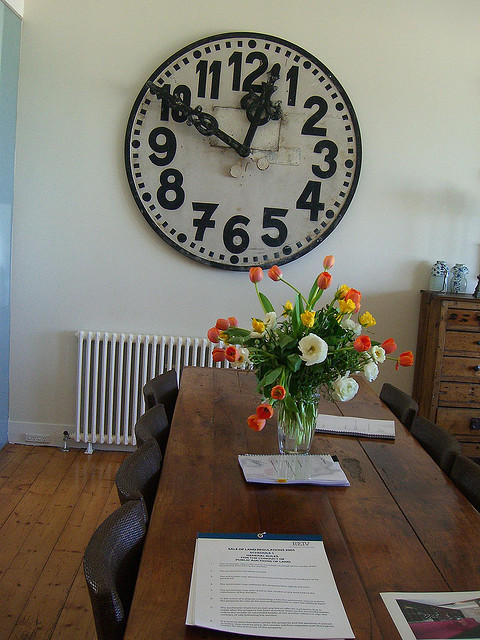

In [9]:
i = 6
print(dataset[i]["caption"])
Image.open(f'./data/train2014/{dataset[i]["filename"]}')

In [3]:
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')
model.encode("The huge clock on the wall is near a wooden table.").shape

(384,)

In [4]:
your_data_generator = []
for data in dataset:
    image = cv2.imread(f'./data/train2014/{data["filename"]}')
    image.resize((64,64,3))
    caption = data["caption"]
    your_data_generator.append(
        {
            "image": image,
            "text": model.encode(caption)
        }
    )

In [5]:
your_data_generator

[{'image': array([[[ 21,  46,  86],
          [ 24,  47,  79],
          [ 35,  52,  79],
          ...,
          [ 29,  45, 112],
          [ 27,  40, 108],
          [ 28,  39, 107]],
  
         [[ 22,  54, 120],
          [ 12,  33, 101],
          [ 28,  44, 110],
          ...,
          [ 26,  54, 148],
          [ 39,  63, 153],
          [ 33,  65, 164]],
  
         [[ 31,  71, 143],
          [ 42,  61, 166],
          [ 48,  77, 182],
          ...,
          [ 97, 202, 245],
          [ 88, 173, 243],
          [ 86, 167, 255]],
  
         ...,
  
         [[ 24,  35,  97],
          [ 22,  39, 102],
          [ 22,  45, 107],
          ...,
          [ 29,  48, 105],
          [ 37,  43,  90],
          [ 30,  34,  92]],
  
         [[ 44,  57, 101],
          [ 28,  37,  80],
          [ 28,  48,  83],
          ...,
          [ 94, 195, 234],
          [ 65, 163, 235],
          [121, 225, 255]],
  
         [[ 89, 195, 249],
          [ 79, 169, 233],
          [142,

Mssv - Phân công nhiệm vụ

## Or

In [19]:
import json
from PIL import Image
from sentence_transformers import SentenceTransformer
import cv2
import numpy as np

In [4]:
dataset = json.load(open("./data/dataset.json", "r"))
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')
model.encode("The huge clock on the wall is near a wooden table.").shape

(384,)

In [20]:
your_data_generator = []
order = list(range(len(dataset)))
np.random.shuffle(order)
for data in dataset:
    image = cv2.imread(f'./data/train2014/{data["filename"]}')
    image.resize((64,64,3))
    caption = data["caption"]
    your_data_generator.append(
        {
            "image": image,
            "text": model.encode(caption),
            "mismatched_text": model.encode(dataset[order.pop()]["caption"])
        }
    )

#### model 1

In [ ]:
import tensorflow as tf
from keras import layers, models, optimizers

In [7]:
# Generator Model
def build_generator(text_embedding_size, noise_dim, image_channels):
    model = models.Sequential()
    model.add(layers.Dense(256, input_dim=text_embedding_size + noise_dim))
    model.add(layers.Reshape((1, 1, 256)))
    model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', activation='relu'))
    model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', activation='relu'))
    model.add(layers.Conv2DTranspose(32, (4, 4), strides=(2, 2), padding='same', activation='relu'))
    model.add(layers.Conv2DTranspose(16, (4, 4), strides=(2, 2), padding='same', activation='relu'))
    model.add(layers.Conv2DTranspose(8, (4, 4), strides=(2, 2), padding='same', activation='relu'))
    model.add(layers.Conv2DTranspose(image_channels, (4, 4), strides=(2, 2), padding='same', activation='tanh'))
    return model

# Discriminator Model
def build_discriminator(image_channels):
    model = models.Sequential()
    model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=(64, 64, image_channels)))
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Flatten())
    model.add(layers.Dense(1))
    return model

# GATIS Model
def build_gatis(text_embedding_size, noise_dim, image_channels):
    text_input = layers.Input(shape=(text_embedding_size,))
    noise_input = layers.Input(shape=(noise_dim,))
    
    text_noise_concat = layers.Concatenate()([text_input, noise_input])
    text_noise_concat = layers.Flatten()(text_noise_concat)
    text_noise_concat = layers.Reshape((-1, ))(text_noise_concat)
    
    generator = build_generator(text_embedding_size, noise_dim, image_channels)
    generated_image = generator(text_noise_concat)
    generator.summary()
    discriminator = build_discriminator(image_channels)
    discriminator.summary()
    discriminator.trainable = False  # Freeze the discriminator during generator training
    
    validity = discriminator(generated_image)

    model = models.Model(inputs=[text_input, noise_input], outputs=validity)
    return model

#### model 2

In [13]:
import tensorflow as tf
from keras import layers, models

class GATISModel(tf.keras.Model):
    def __init__(self, text_embedding_size, noise_dim, image_channels):
        super(GATISModel, self).__init__()

        # Generator
        self.generator = self.build_generator(text_embedding_size, noise_dim, image_channels)

        # Discriminator
        self.discriminator = self.build_discriminator(image_channels)
    
    def build_generator(self, text_embedding_size, noise_dim, image_channels):
        model = models.Sequential()
        model.add(layers.Dense(256, input_dim=text_embedding_size + noise_dim, activation='relu'))
        model.add(layers.Reshape((1, 1, 256)))
        model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', activation='relu'))
        model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', activation='relu'))
        model.add(layers.Conv2DTranspose(32, (4, 4), strides=(2, 2), padding='same', activation='relu'))
        model.add(layers.Conv2DTranspose(16, (4, 4), strides=(2, 2), padding='same', activation='relu'))
        model.add(layers.Conv2DTranspose(8, (4, 4), strides=(2, 2), padding='same', activation='relu'))
        model.add(layers.Conv2DTranspose(image_channels, (4, 4), strides=(2, 2), padding='same', activation='tanh'))
        return model

    
    def build_discriminator(self, image_channels):
        model = models.Sequential()
        model.add(layers.Conv2D(8, (4, 4), strides=(2, 2), padding='same', input_shape=(64, 64, image_channels)))
        model.add(layers.BatchNormalization())
        model.add(layers.LeakyReLU(0.2))
        model.add(layers.Conv2D(16, (4, 4), strides=(2, 2), padding='same'))
        model.add(layers.BatchNormalization())
        model.add(layers.LeakyReLU(0.2))
        model.add(layers.Conv2D(32, (4, 4), strides=(2, 2), padding='same'))
        model.add(layers.BatchNormalization())
        model.add(layers.LeakyReLU(0.2))
        model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same'))
        model.add(layers.BatchNormalization())
        model.add(layers.LeakyReLU(0.2))
        model.add(layers.Flatten())
        model.add(layers.Dense(1))
        return model

    def compile_models(self, generator_optimizer, discriminator_optimizer, loss_fn):
        super(GATISModel, self).compile()

        self.generator_optimizer = generator_optimizer
        self.discriminator_optimizer = discriminator_optimizer
        self.loss_fn = loss_fn

        self.compile_generator()
        self.compile_discriminator()

    def compile_discriminator(self):
        self.discriminator.compile(optimizer=self.discriminator_optimizer, loss=self.loss_fn)

    def compile_generator(self):
        self.generator.compile(optimizer=self.generator_optimizer, loss=self.loss_fn)

    def train_step(self, data):
        real_images, input_text = data

        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal((batch_size, noise_dim))

        # Train Discriminator
        with tf.GradientTape() as tape_discriminator:
            generated_images = self.generator(tf.concat([input_text, noise], axis=1), training=True)

            real_logits = self.discriminator(real_images, training=True)
            fake_logits = self.discriminator(generated_images, training=True)

            real_labels = tf.ones_like(real_logits)
            fake_labels = tf.zeros_like(fake_logits)

            discriminator_real_loss = self.loss_fn(real_labels, real_logits)
            discriminator_fake_loss = self.loss_fn(fake_labels, fake_logits)
            discriminator_loss = 0.5 * (discriminator_real_loss + discriminator_fake_loss)

        discriminator_gradients = tape_discriminator.gradient(discriminator_loss, self.discriminator.trainable_variables)
        self.discriminator_optimizer.apply_gradients(zip(discriminator_gradients, self.discriminator.trainable_variables))

        # Train Generator
        with tf.GradientTape() as tape_generator:
            generated_images = self.generator(tf.concat([input_text, noise], axis=1), training=True)
            fake_logits = self.discriminator(generated_images, training=True)
            generator_loss = self.loss_fn(real_labels, fake_logits)

        generator_gradients = tape_generator.gradient(generator_loss, self.generator.trainable_variables)
        self.generator_optimizer.apply_gradients(zip(generator_gradients, self.generator.trainable_variables))

        return {'discriminator_loss': discriminator_loss, 'generator_loss': generator_loss}

# Example Usage
text_embedding_size = 300
noise_dim = 100
image_channels = 3

gatis = GATISModel(text_embedding_size, noise_dim, image_channels)
gatis.compile_models(
    generator_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    discriminator_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    loss_fn=tf.keras.losses.BinaryCrossentropy(from_logits=True)
)

#### Model 3

In [60]:
class Generator(tf.keras.Model):
    def __init__(self, text_embedding_size, noise_dim, image_channels):
        super(Generator, self).__init__()
        self.noise_dim = noise_dim
        self.text_embedding_size = text_embedding_size
        self.image_channels = image_channels
        self.init_layer()
    
    def init_layer(self):
        self.dense_into_dim = layers.Dense(256, input_dim=self.text_embedding_size + self.noise_dim)
        self.reshape = layers.Reshape((1, 1, 256))
        self.conv2d_transpose_2_2 = layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', activation='relu')
        self.conv2d_transpose_4_4 = layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', activation='relu')
        self.conv2d_transpose_8_8 = layers.Conv2DTranspose(32, (4, 4), strides=(2, 2), padding='same', activation='relu')
        self.conv2d_transpose_16_16 = layers.Conv2DTranspose(16, (4, 4), strides=(2, 2), padding='same', activation='relu')
        self.conv2d_transpose_32_32 = layers.Conv2DTranspose(8, (4, 4), strides=(2, 2), padding='same', activation='relu')
        self.conv2d_transpose_64_64_3 = layers.Conv2DTranspose(self.image_channels, (4, 4), strides=(2, 2), padding='same', activation='tanh')

    
    def forward(self, text_embedding, noise):
        x = layers.Concatenate()([text_embedding, noise])
        x = self.dense_into_dim(x)
        x = self.reshape(x)
        x = self.conv2d_transpose_2_2(x)
        x = self.conv2d_transpose_4_4(x)
        x = self.conv2d_transpose_8_8(x)
        x = self.conv2d_transpose_16_16(x)
        x = self.conv2d_transpose_32_32(x)
        x = self.conv2d_transpose_64_64_3(x)
        return x
    
    def call(self, inputs):
        return self.forward(inputs[0], inputs[1])


In [140]:
class Discriminator(tf.keras.Model):
    def __init__(self, image_channels):
        super(Discriminator, self).__init__()
        self.image_channels = image_channels
        self.init_layer()
    
    def init_layer(self):
        self.conv2d_32_32_8 = layers.Conv2D(8, (4, 4), strides=(2, 2), padding='same', input_shape=(64, 64, self.image_channels))
        self.batch_normalization_1 = layers.BatchNormalization()
        self.leaky_relu_1 = layers.LeakyReLU(0.2)
        self.conv2d_16_16_16 = layers.Conv2D(16, (4, 4), strides=(2, 2), padding='same')
        self.batch_normalization_2 = layers.BatchNormalization()
        self.leaky_relu_2 = layers.LeakyReLU(0.2)
        self.conv2d_8_8_32 = layers.Conv2D(32, (4, 4), strides=(2, 2), padding='same')
        self.batch_normalization_3 = layers.BatchNormalization()
        self.leaky_relu_3 = layers.LeakyReLU(0.2)
        self.conv2d_4_4_64 = layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same')
        self.batch_normalization_4 = layers.BatchNormalization()
        self.leaky_relu_4 = layers.LeakyReLU(0.2)
        self.flatten = layers.Flatten()
        self.dense = layers.Dense(1, activation='sigmoid')
    
    def forward(self, image, text_embedding):
        reshaped_text_embedding = layers.Reshape((4, 4, -1))(text_embedding)

        x = self.conv2d_32_32_8(image)
        x = self.batch_normalization_1(x)
        x = self.leaky_relu_1(x)
        x = self.conv2d_16_16_16(x)
        x = self.batch_normalization_2(x)
        x = self.leaky_relu_2(x)
        x = self.conv2d_8_8_32(x)
        x = self.batch_normalization_3(x)
        x = self.leaky_relu_3(x)
        x = self.conv2d_4_4_64(x)
        x = self.batch_normalization_4(x)
        x = tf.concat([x, reshaped_text_embedding], axis=3)
        x = self.leaky_relu_4(x)
        x = self.flatten(x)
        x = self.dense(x)
        return x
    
    def call(self, inputs):
        return self.forward(inputs[0], inputs[1])

#### Splited into mini batchs

In [94]:
num_epochs = 10
batch_size = 2#64
your_splited_data_generator = []
for i in range(0, len(your_data_generator), batch_size):
    batch_data = your_data_generator[i:i+batch_size]
    real_images = []
    input_text = []
    input_missmatched_text = []
    for data in batch_data:
        real_images.append(data["image"])
        input_text.append(data["text"])
        input_missmatched_text.append(data["mismatched_text"])

    real_images = tf.convert_to_tensor(real_images, dtype=tf.float32)
    input_text = tf.convert_to_tensor(input_text)
    your_splited_data_generator.append(
        {
            "images": real_images,
            "text": input_text,
            "missmatched_text": input_missmatched_text
        }
    )

In [89]:
def splited_data_into_minibatch(data, batch_size):
    splited_batch_data = []
    for i in range(0, len(data), batch_size):
        batch_data = data[i:i+batch_size]
        if len(batch_data) < batch_size:
            break
        real_images = []
        input_text = []
        input_missmatched_text = []
        for obj in batch_data:
            real_images.append(obj["image"])
            input_text.append(obj["text"])
            input_missmatched_text.append(obj["mismatched_text"])

        real_images = tf.convert_to_tensor(real_images, dtype=tf.float32)
        input_text = tf.convert_to_tensor(input_text)
        splited_batch_data.append(
            {
                "images": real_images,
                "text": input_text,
                "missmatched_text": input_missmatched_text
            }
        )
    return splited_batch_data

In [197]:
dataset = splited_data_into_minibatch(your_data_generator, 2)
len(dataset)

1500

#### Config

In [196]:
text_embedding_size = 384
noise_dim = 100
image_channels = 3

#### Test input and output of model3

In [198]:
generator = Generator(text_embedding_size, noise_dim, image_channels)
discriminator = Discriminator(image_channels)

In [199]:
datas = (your_splited_data_generator[0]["text"], tf.random.normal((2, noise_dim)))
result = generator(datas)

In [200]:
sr = discriminator((your_splited_data_generator[0]["images"], your_splited_data_generator[0]["text"]))
sw = discriminator((your_splited_data_generator[0]["images"], your_splited_data_generator[0]["missmatched_text"]))
sf = discriminator((result, your_splited_data_generator[0]["text"]))

In [201]:
sr, 1 - sw,1 - sf

(<tf.Tensor: shape=(2, 1), dtype=float32, numpy=
 array([[0.00016009],
        [0.04114273]], dtype=float32)>,
 <tf.Tensor: shape=(2, 1), dtype=float32, numpy=
 array([[0.99983263],
        [0.9585092 ]], dtype=float32)>,
 <tf.Tensor: shape=(2, 1), dtype=float32, numpy=
 array([[0.50915605],
        [0.50494504]], dtype=float32)>)

In [202]:
def Loss_Discriminator(sr, sw, sf):
    L_D = tf.pow(tf.math.log(sr), 2) + (tf.pow(tf.math.log(1 - sw),2) + tf.pow(tf.math.log(1 - sf),2))/2
    return L_D

def Loss_Generator(sf):
    L_G = tf.pow(tf.math.log(sf), 2)
    return L_G

In [203]:
L_D = tf.pow(tf.math.log(sr) + (tf.math.log(1 - sw) + tf.math.log(1 - sf))/2, 2)
print(L_D)
print(Loss_Discriminator(sr, sw, sf))

tf.Tensor(
[[82.39852 ]
 [12.627709]], shape=(2, 1), dtype=float32)
tf.Tensor(
[[76.61154  ]
 [10.4149685]], shape=(2, 1), dtype=float32)


In [204]:
L_G = tf.pow(tf.math.log(sf), 2)
print(L_G)
print(Loss_Generator(sf))

tf.Tensor(
[[0.5064159]
 [0.4943306]], shape=(2, 1), dtype=float32)
tf.Tensor(
[[0.5064159]
 [0.4943306]], shape=(2, 1), dtype=float32)


## Train

In [205]:
import random
from keras import metrics

epochs = 40
batch_size = 32
dataset = splited_data_into_minibatch(your_data_generator, batch_size)

#model
generator = Generator(text_embedding_size, noise_dim, image_channels)
discriminator = Discriminator(image_channels)

In [209]:
optimizer_D = optimizers.Adam()
optimizer_G = optimizers.Adam()

hist = {"loss_D": [], "loss_G": []}
for epoch in range(epochs):
    epoch_loss_D = metrics.Mean()
    epoch_loss_G = metrics.Mean()
    print(f"Epoch {epoch+1}/{epochs}")
    epoch_loss = 0.0

    # Mini-batch training loop
    shuffled_dataset = dataset.copy()
    # random.shuffle(shuffled_dataset)
    for batch_data in dataset:

        with tf.GradientTape(persistent=True) as tape:
            noise = tf.random.normal((batch_size, noise_dim))
            # Forward pass
            fake_images = generator((batch_data["text"], noise))
            # Calculate the loss
            sr = discriminator((batch_data["images"], batch_data["text"]))
            sw = discriminator((batch_data["images"], batch_data["missmatched_text"]))
            sf = discriminator((fake_images, batch_data["text"]))
            loss_G = Loss_Generator(sf)
            loss_D = Loss_Discriminator(sr, sw, sf)

        # Backward pass and optimization
        gradients_D = tape.gradient(loss_D, generator.trainable_variables)
        optimizer_D.apply_gradients(zip(gradients_D, generator.trainable_variables))

        gradients_G = tape.gradient(loss_G, generator.trainable_variables)
        optimizer_G.apply_gradients(zip(gradients_G, generator.trainable_variables))

        epoch_loss_D.update_state(loss_D)
        epoch_loss_G.update_state(loss_G)

    print(f"Loss_D: {epoch_loss_D.result()}, Loss_G: {epoch_loss_G.result()}")
    hist["loss_D"].append(epoch_loss_D.result())
    hist["loss_G"].append(epoch_loss_G.result())

# After training, you can evaluate the model if needed
# Assuming you have test data (X_test, y_test)

Epoch 1/40
Loss_D: inf, Loss_G: 0.48368725180625916
Epoch 2/40
Loss_D: inf, Loss_G: 0.4836592376232147
Epoch 3/40
Loss_D: inf, Loss_G: 0.48377862572669983
Epoch 4/40


KeyboardInterrupt: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


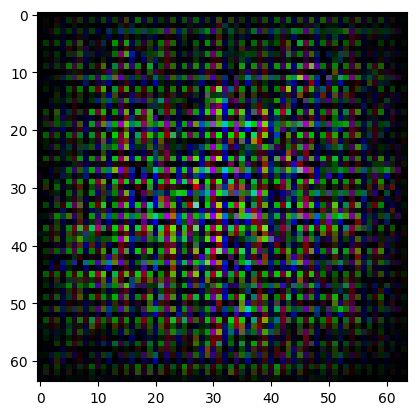

In [157]:
import matplotlib.pyplot as plt
plt.imshow(generator((dataset[0]["text"], noise))[0])

In [14]:
gatis = GATISModel(text_embedding_size, noise_dim, image_channels)
gatis.compile_models(
    generator_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    discriminator_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    loss_fn=tf.keras.losses.BinaryCrossentropy(from_logits=True)
)

In [12]:
your_splited_data_generator[0]

{'images': <tf.Tensor: shape=(2, 64, 64, 3), dtype=int32, numpy=
 array([[[[ 21,  46,  86],
          [ 24,  47,  79],
          [ 35,  52,  79],
          ...,
          [ 29,  45, 112],
          [ 27,  40, 108],
          [ 28,  39, 107]],
 
         [[ 22,  54, 120],
          [ 12,  33, 101],
          [ 28,  44, 110],
          ...,
          [ 26,  54, 148],
          [ 39,  63, 153],
          [ 33,  65, 164]],
 
         [[ 31,  71, 143],
          [ 42,  61, 166],
          [ 48,  77, 182],
          ...,
          [ 97, 202, 245],
          [ 88, 173, 243],
          [ 86, 167, 255]],
 
         ...,
 
         [[ 24,  35,  97],
          [ 22,  39, 102],
          [ 22,  45, 107],
          ...,
          [ 29,  48, 105],
          [ 37,  43,  90],
          [ 30,  34,  92]],
 
         [[ 44,  57, 101],
          [ 28,  37,  80],
          [ 28,  48,  83],
          ...,
          [ 94, 195, 234],
          [ 65, 163, 235],
          [121, 225, 255]],
 
         [[ 89, 195

In [15]:
gatis.fit(your_splited_data_generator, epochs=num_epochs)

Epoch 1/10


ValueError: in user code:

    File "d:\Code\MachineLearning\GAN\venv\Lib\site-packages\keras\src\engine\training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "d:\Code\MachineLearning\GAN\venv\Lib\site-packages\keras\src\engine\training.py", line 1384, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "d:\Code\MachineLearning\GAN\venv\Lib\site-packages\keras\src\engine\training.py", line 1373, in run_step  **
        outputs = model.train_step(data)
    File "C:\Users\DELL\AppData\Local\Temp\ipykernel_16980\1152152581.py", line 48, in train_step
        real_images, input_text = data

    ValueError: not enough values to unpack (expected 2, got 1)


In [5]:
# Compile the GATIS Model
gatis = build_gatis(text_embedding_size, noise_dim, image_channels)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 256)               124160    
                                                                 
 reshape_1 (Reshape)         (None, 1, 1, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 2, 2, 128)         524416    
 anspose)                                                        
                                                                 
 conv2d_transpose_1 (Conv2D  (None, 4, 4, 64)          131136    
 Transpose)                                                      
                                                                 
 conv2d_transpose_2 (Conv2D  (None, 8, 8, 32)          32800     
 Transpose)                                                      
                                                       

In [6]:
gatis.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 384)]                0         []                            
                                                                                                  
 input_2 (InputLayer)        [(None, 100)]                0         []                            
                                                                                                  
 concatenate (Concatenate)   (None, 484)                  0         ['input_1[0][0]',             
                                                                     'input_2[0][0]']             
                                                                                                  
 flatten (Flatten)           (None, 484)                  0         ['concatenate[0][0]']     

In [20]:
optimizer = optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
gatis.compile(optimizer=optimizer, loss='binary_crossentropy')

for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    for index, batch_data in enumerate(your_splited_data_generator):  # Implement your own data generatorimport sys
        
        real_images = batch_data['images']
        input_text = batch_data['text']
        noise = tf.random.normal((batch_size, noise_dim))
        # Train the discriminator
        with tf.GradientTape() as disc_tape:
            generated_images = gatis([input_text, noise], training=True)
            
            real_labels = tf.ones((batch_size, 1))
            fake_labels = tf.zeros((batch_size, 1))
            disc_loss_real = tf.keras.losses.binary_crossentropy(real_labels, gatis([input_text, noise], training=True))
            disc_loss_fake = tf.keras.losses.binary_crossentropy(fake_labels, gatis([input_text, noise], training=True))
            discriminator_loss = 0.5 * (disc_loss_real + disc_loss_fake)

        if index % 500 == 0:
            print(f"Batch {index+1}/{len(your_splited_data_generator)}: loss = {discriminator_loss}")
        gradients_of_discriminator = disc_tape.gradient(discriminator_loss, gatis.trainable_variables)
        optimizer.apply_gradients(zip(gradients_of_discriminator, gatis.trainable_variables))

        # Train the generator
        with tf.GradientTape() as gen_tape:
            generated_images = gatis([input_text, noise], training=True)
            generator_loss = tf.keras.losses.binary_crossentropy(real_labels, gatis([input_text, noise], training=True))

        gradients_of_generator = gen_tape.gradient(generator_loss, gatis.trainable_variables)
        optimizer.apply_gradients(zip(gradients_of_generator, gatis.trainable_variables))

    # Optionally, you can evaluate and generate samples during training
    # ...

# Save your trained models if needed
gatis.save_weights('gatis_weights.h5')

Epoch 1/10
Batch 1/1500: loss = [0.8269669 0.8269949]
Batch 501/1500: loss = [0.83669984 0.8366786 ]
Batch 1001/1500: loss = [0.83668727 0.8368242 ]
Epoch 2/10
Batch 1/1500: loss = [0.83645636 0.8366872 ]
Batch 501/1500: loss = [0.83667684 0.83703494]
Batch 1001/1500: loss = [0.8367668  0.83705294]
Epoch 3/10
Batch 1/1500: loss = [0.8365342  0.83672035]
Batch 501/1500: loss = [0.83671844 0.83672184]
Batch 1001/1500: loss = [0.8367209 0.8366278]
Epoch 4/10
Batch 1/1500: loss = [0.83662444 0.83663684]
Batch 501/1500: loss = [0.8363351  0.83672047]
Batch 1001/1500: loss = [0.8362713 0.8364649]
Epoch 5/10
Batch 1/1500: loss = [0.8367169 0.8365834]
Batch 501/1500: loss = [0.8366513  0.83699745]
Batch 1001/1500: loss = [0.836841   0.83676136]
Epoch 6/10
Batch 1/1500: loss = [0.8366724 0.8366711]
Batch 501/1500: loss = [0.8362018  0.83682066]
Batch 1001/1500: loss = [0.83694535 0.834244  ]
Epoch 7/10
Batch 1/1500: loss = [0.8369099 0.837113 ]
Batch 501/1500: loss = [0.8368367  0.83678496]
Bat

In [21]:
generated_images = gatis.predict([input_text, noise])

1/1 [==============================] - 0s 423ms/step


In [22]:
generated_images

array([[0.7497438],
       [0.7497346]], dtype=float32)